# 1. Import and Install Dependencies

In [1]:
!pip install tensorflow opencv-python mediapipe scikit-learn matplotlib

In [1]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
import time
import mediapipe as mp

# 2. Keypoints using MP Holistic

In [2]:
mp_holistic = mp.solutions.holistic # Holistic model
mp_drawing = mp.solutions.drawing_utils # Drawing utilities

In [3]:
def mediapipe_detection(image, model):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # COLOR CONVERSION BGR 2 RGB
    image.flags.writeable = False                  # Image is no longer writeable
    results = model.process(image)                 # Make prediction
    image.flags.writeable = True                   # Image is now writeable 
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # COLOR COVERSION RGB 2 BGR
    return image, results

In [4]:
def draw_landmarks(image, results):
#     mp_drawing.draw_landmarks(image, results.face_landmarks, mp_holistic.FACE_CONNECTIONS) # Draw face connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS) # Draw pose connections
#     mp_drawing.draw_landmarks(image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw left hand connections
#     mp_drawing.draw_landmarks(image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS) # Draw right hand connections

In [5]:
def draw_styled_landmarks(image, results):

    # Draw pose connections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
                             mp_drawing.DrawingSpec(color=(80,22,10), thickness=2, circle_radius=4), 
                             mp_drawing.DrawingSpec(color=(80,44,121), thickness=2, circle_radius=2)
                             ) 


In [6]:
mp_drawing.draw_landmarks()

TypeError: draw_landmarks() missing 2 required positional arguments: 'image' and 'landmark_list'

In [6]:
import cv2
import mediapipe as mp

# Initialize mediapipe
mp_holistic = mp.solutions.holistic


cap = cv2.VideoCapture(0)
HEIGHT = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))  # Webcam video frame height
WIDTH = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))  # Webcam video frame width
FPS = int(cap.get(cv2.CAP_PROP_FPS))  # Webcam video frame rate

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('test.avi', fourcc, FPS, (WIDTH, HEIGHT))

# Set mediapipe model
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    while cap.isOpened():

        # Read feed
        ret, frame = cap.read()

        # Make detections
        image, results = mediapipe_detection(frame, holistic)
        
        # Draw landmarks
        draw_styled_landmarks(image, results)

        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Write the frame into the file 'output.avi'
        out.write(image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break

cap.release()
out.release()  # Release the video writer
cv2.destroyAllWindows()


In [7]:
draw_styled_landmarks(frame, results)

NameError: name 'frame' is not defined

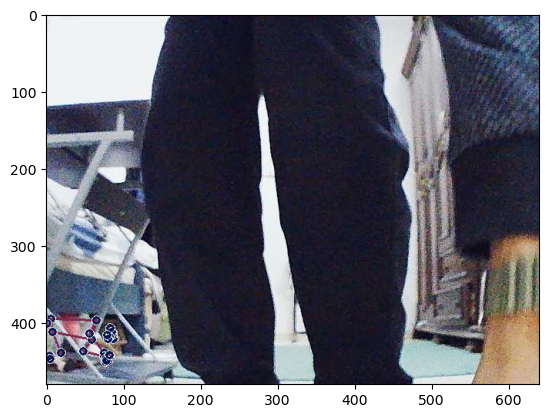

In [180]:
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

# 3. Extract Keypoint Values

In [ ]:
results.pose_landmarks

In [7]:
def extract_keypoints(results):
    pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten() if results.pose_landmarks else np.zeros(33*4)
    return pose

In [28]:
result_test = extract_keypoints(results)

NameError: name 'results' is not defined

In [29]:
result_test.shape

NameError: name 'result_test' is not defined

# 4. Setup Folders for Collection

In [ ]:
# # Path for exported data, numpy arrays
# DATA_PATH = os.path.join('MP_Data') 

# # Actions that we try to detect
# actions = np.array(['hello', 'thanks', 'iloveyou'])

# # Thirty videos worth of data
# no_sequences = 30

# # Videos are going to be 30 frames in length
# sequence_length = 30

# # Folder start
# start_folder = 30

In [9]:
# actions = np.array(['pushup', 'squat', 'lunge','raise','jack', 'noactions'])
# num_classes = len(actions)

In [8]:
# Path for exported data, numpy arrays
DATA_PATH = os.path.join(os. getcwd(),'data') 
print(DATA_PATH)

# make directory if it does not exist yet
if not os.path.exists(DATA_PATH):
    os.makedirs(DATA_PATH)

# Actions/exercises that we try to detect
actions = np.array(['pushup', 'squat', 'lunge', 'noactions'])
num_classes = len(actions)

# How many videos worth of data
no_sequences = 2

# Videos are going to be this many frames in length
sequence_length = 30

# Folder start
# Change this to collect more data and not lose previously collected data
start_folder = 151


C:\Users\theak\gym_pose_trainer\gym_pose_trainer\data


In [56]:
# main_folder = 'jack'
# os.makedirs(main_folder, exist_ok=True)

# # Create subfolders ranging from 101 to 150
# for folder_num in range(101, 151):
#     folder_name = os.path.join(main_folder, str(folder_num))
#     os.makedirs(folder_name, exist_ok=True)

# print(f"Folders created successfully in '{main_folder}'.")

In [9]:
for action in actions: 
    dirmax = np.max(np.array(os.listdir(os.path.join(DATA_PATH, action))).astype(int))
    for sequence in range(1,no_sequences+1):
        try: 
            os.makedirs(os.path.join(DATA_PATH, action, str(dirmax+sequence)))
        except:
            pass

In [10]:
# Colors associated with each exercise (e.g., curls are denoted by blue, squats are denoted by orange, etc.)
colors = [(245,117,16), (117,245,16), (16,117,245), (1,300,100)]

In [11]:
DATA_PATH

'C:\\Users\\theak\\gym_pose_trainer\\gym_pose_trainer\\data'

In [61]:
import cv2
import os
import numpy as np
import mediapipe as mp

# Initialize mediapipe
mp_holistic = mp.solutions.holistic


cap = cv2.VideoCapture(0)

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
# You might want to use 'out' variable dynamically for different actions and sequences
out = cv2.VideoWriter('data5.avi', fourcc, 20.0, (640, 480))

# Set mediapipe model
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    
    # Loop through actions
    for action in actions:
        # Loop through sequences aka videos
        for sequence in range(start_folder, start_folder + no_sequences):
            # Loop through video length aka sequence length
            for frame_num in range(sequence_length):

                # Read feed
                ret, frame = cap.read()

                # Make detections
                image, results = mediapipe_detection(frame, holistic)

                # Draw landmarks
                draw_styled_landmarks(image, results)
                
                # Apply wait logic
                if frame_num == 0: 
                    cv2.putText(image, 'STARTING COLLECTION', (120,200), 
                                cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255, 0), 4, cv2.LINE_AA)
                    cv2.putText(image, f'Collecting frames for {action} Video Number {sequence}', (15,20), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 1, cv2.LINE_AA)
                    cv2.imshow('OpenCV Feed', image)
                    cv2.waitKey(2000)

                else: 
                    cv2.putText(image, f'Collecting frames for {action} Video Number {sequence}', (15,20), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)
                    cv2.imshow('OpenCV Feed', image)

                # Show to screen
                

                # Write the frame into the file 'output.avi'
                out.write(image)

                # Export keypoints
                keypoints = extract_keypoints(results)
                npy_path = os.path.join(DATA_PATH, action, str(sequence), str(frame_num))
                np.save(npy_path, keypoints)

                # Break gracefully
                if cv2.waitKey(10) & 0xFF == ord('q'):
                    break

cap.release()
out.release()  # Release the video writer
cv2.destroyAllWindows()


In [67]:
cap.release()
cv2.destroyAllWindows()

# 6. Preprocess Data and Create Labels and Features

In [12]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [13]:
label_map = {label:num for num, label in enumerate(actions)}

In [14]:
label_map

{'pushup': 0, 'squat': 1, 'lunge': 2, 'noactions': 3}

In [16]:
sequences, labels = [], []
for action in actions:
    for sequence in np.array(os.listdir(os.path.join(DATA_PATH, action))).astype(int):
        window = []
        for frame_num in range(sequence_length):
            res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])

In [45]:
# # Load and organize recorded training data
# sequences, labels = [], []
# for action in actions:
#     for sequence in np.array(os.listdir(os.path.join(DATA_PATH, action))).astype(int):
#         window = []
#         for frame_num in range(sequence_length):         
#             # LSTM input data
#             res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)))
#             window.append(res)  
            
#         sequences.append(window)
#         labels.append(label_map[action])

In [168]:
sequences

[[array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
  array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 

In [73]:
# Make sure first dimensions of arrays match
X = np.array(sequences)
y = to_categorical(labels).astype(int)
print(X.shape, y.shape)

(300, 30, 132) (300, 4)


In [74]:
np.array(sequences).shape

(300, 30, 132)

In [75]:
np.array(labels).shape

(300,)

In [76]:
X = np.array(sequences)

In [77]:
X.shape

(300, 30, 132)

In [78]:
y = to_categorical(labels).astype(int)

In [79]:
# Split into training, validation, and testing datasets


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=1)
# print(X_train.shape, y_train.shape)
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=15/90, random_state=2)
# print(X_train.shape, X_test.shape,X_val.shape)

In [44]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

In [22]:
y_test.shape

NameError: name 'y_test' is not defined

# 7. Build and Train LSTM Neural Network

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import multilabel_confusion_matrix, accuracy_score, classification_report
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

from tensorflow.keras.models import Sequential, Model

from tensorflow.keras.layers import (LSTM, Dense, Concatenate, Attention, Dropout, Softmax,
                                     Input, Flatten, Activation, Bidirectional, Permute, multiply, 
                                     ConvLSTM2D, MaxPooling3D, TimeDistributed, Conv2D, MaxPooling2D)

from scipy import stats

# disable some of the tf/keras training warnings 
os.environ['TF_CPP_MIN_LOG_LEVEL'] = "3"
tf.get_logger().setLevel("ERROR")
tf.autograph.set_verbosity(1)

# suppress untraced functions warning
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)

In [176]:
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import LSTM, Dense
# from tensorflow.keras.callbacks import TensorBoard

In [182]:
# Callbacks to be used during neural network training 
es_callback = EarlyStopping(monitor='val_loss', min_delta=5e-4, patience=10, verbose=0, mode='min')
lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001, verbose=0, mode='min')
chkpt_callback = ModelCheckpoint(filepath=DATA_PATH, monitor='val_loss', verbose=0, save_best_only=True, 
                                 save_weights_only=False, mode='min', save_freq=1)

# # Optimizer
# opt = tf.keras.optimizers.Adam(learning_rate=0.01)

# # some hyperparamters
# batch_size = 32
# max_epochs = 500

In [183]:
# Set up Tensorboard logging and callbacks
NAME = f"ExerciseRecognition-LSTM-{int(time.time())}"
log_dir = os.path.join(os.getcwd(), 'logs', NAME,'')
tb_callback = TensorBoard(log_dir=log_dir)

callbacks = [tb_callback, es_callback, lr_callback, chkpt_callback]

In [179]:
# lstm = Sequential()
# lstm.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(sequence_length, 132)))
# lstm.add(LSTM(128, return_sequences=True, activation='relu'))
# lstm.add(LSTM(64, return_sequences=False, activation='relu'))
# lstm.add(Dense(64, activation='relu'))
# lstm.add(Dense(32, activation='relu'))
# lstm.add(Dense(actions.shape[0], activation='softmax'))
# print(lstm.summary())

In [180]:
# lstm.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
# lstm.fit(X_train, y_train, batch_size=batch_size, epochs=max_epochs, validation_data=(X_val, y_val))

In [53]:
# log_dir = os.path.join('Logs')
# tb_callback = TensorBoard(log_dir=log_dir)

In [54]:
# model = Sequential()
# model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(30,1662)))
# model.add(LSTM(128, return_sequences=True, activation='relu'))
# model.add(LSTM(64, return_sequences=False, activation='relu'))
# model.add(Dense(64, activation='relu'))
# model.add(Dense(32, activation='relu'))
# model.add(Dense(actions.shape[0], activation='softmax'))

In [31]:
#trying nicholas
X = np.array(sequences)
y = to_categorical(labels).astype(int)


In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)


In [64]:
log_dir = os.path.join('Logs2')
tb_callback = TensorBoard(log_dir=log_dir)

In [65]:
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
actions

array(['pushup', 'squat', 'lunge', 'noactions'], dtype='<U9')

In [67]:
fold_no = 1
for train, test in kfold.split(X, y):
    # Define the LSTM model architecture within the loop
    lstm = Sequential()
    lstm.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(30, 132)))
    lstm.add(LSTM(128, return_sequences=True, activation='relu'))
    lstm.add(LSTM(64, return_sequences=False, activation='relu'))
    lstm.add(Dense(64, activation='relu'))
    lstm.add(Dense(32, activation='relu'))
    lstm.add(Dense(actions.shape[0], activation='softmax'))

    # Compile the model
    lstm.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])

    # Train the model
    print(f'Training for fold {fold_no} ...')
    history = lstm.fit(X[train], y[train], 
                       validation_data=(X[test], y[test]),
                       epochs=20, callbacks=tb_callback)  # Adjust the number of epochs as needed

    # Increase the fold number
    fold_no += 1


Training for fold 1 ...
Epoch 1/20
8/8 [==============================] - 10s 243ms/step - loss: 1.3446 - categorical_accuracy: 0.3500 - val_loss: 1.1829 - val_categorical_accuracy: 0.4833
Epoch 2/20
8/8 [==============================] - 1s 73ms/step - loss: 1.1574 - categorical_accuracy: 0.4833 - val_loss: 1.0218 - val_categorical_accuracy: 0.5333
Epoch 3/20
8/8 [==============================] - 1s 72ms/step - loss: 0.9142 - categorical_accuracy: 0.5583 - val_loss: 0.5639 - val_categorical_accuracy: 0.6833
Epoch 4/20
8/8 [==============================] - 1s 73ms/step - loss: 0.7371 - categorical_accuracy: 0.7167 - val_loss: 0.4836 - val_categorical_accuracy: 0.9000
Epoch 5/20
8/8 [==============================] - 1s 79ms/step - loss: 0.5097 - categorical_accuracy: 0.8208 - val_loss: 0.6636 - val_categorical_accuracy: 0.7667
Epoch 6/20
8/8 [==============================] - 0s 64ms/step - loss: 0.7017 - categorical_accuracy: 0.7167 - val_loss: 0.5714 - val_categorical_accuracy: 0.9

Epoch 11/20
8/8 [==============================] - 0s 42ms/step - loss: 0.3861 - categorical_accuracy: 0.8458 - val_loss: 0.5036 - val_categorical_accuracy: 0.7167
Epoch 12/20
8/8 [==============================] - 0s 42ms/step - loss: 0.4650 - categorical_accuracy: 0.8542 - val_loss: 1.6534 - val_categorical_accuracy: 0.8000
Epoch 13/20
8/8 [==============================] - 0s 42ms/step - loss: 0.7234 - categorical_accuracy: 0.7750 - val_loss: 0.5877 - val_categorical_accuracy: 0.7500
Epoch 14/20
8/8 [==============================] - 0s 41ms/step - loss: 0.5123 - categorical_accuracy: 0.8125 - val_loss: 0.5618 - val_categorical_accuracy: 0.8000
Epoch 15/20
8/8 [==============================] - 0s 41ms/step - loss: 0.4537 - categorical_accuracy: 0.8625 - val_loss: 0.5257 - val_categorical_accuracy: 0.8167
Epoch 16/20
8/8 [==============================] - 0s 41ms/step - loss: 0.5534 - categorical_accuracy: 0.8292 - val_loss: 0.5933 - val_categorical_accuracy: 0.7500
Epoch 17/20
8/8 

In [58]:
# Define the LSTM model architecture within the loop
lstm = Sequential()
lstm.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(30, 132)))
lstm.add(LSTM(128, return_sequences=True, activation='relu'))
lstm.add(LSTM(64, return_sequences=False, activation='relu'))
lstm.add(Dense(64, activation='relu'))
lstm.add(Dense(32, activation='relu'))
lstm.add(Dense(actions.shape[0], activation='softmax'))

In [59]:
lstm.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [60]:
lstm.fit(X_train, y_train, epochs=200, callbacks=[tb_callback])

Epoch 1/200
8/8 [==============================] - 6s 41ms/step - loss: 1.3475 - categorical_accuracy: 0.3608
Epoch 2/200
8/8 [==============================] - 0s 44ms/step - loss: 1.1727 - categorical_accuracy: 0.4588
Epoch 3/200
8/8 [==============================] - 0s 41ms/step - loss: 1.3113 - categorical_accuracy: 0.6392
Epoch 4/200
8/8 [==============================] - 0s 41ms/step - loss: 1.2628 - categorical_accuracy: 0.6510
Epoch 5/200
8/8 [==============================] - 0s 43ms/step - loss: 3.1754 - categorical_accuracy: 0.4941
Epoch 6/200
8/8 [==============================] - 0s 43ms/step - loss: 3.9518 - categorical_accuracy: 0.5020
Epoch 7/200
8/8 [==============================] - 0s 43ms/step - loss: 1.5823 - categorical_accuracy: 0.4863
Epoch 8/200
8/8 [==============================] - 0s 43ms/step - loss: 0.9549 - categorical_accuracy: 0.6980
Epoch 9/200
8/8 [==============================] - 0s 41ms/step - loss: 0.9583 - categorical_accuracy: 0.6667
Epoch 10/2

8/8 [==============================] - 0s 32ms/step - loss: 0.0483 - categorical_accuracy: 0.9882
Epoch 75/200
8/8 [==============================] - 0s 33ms/step - loss: 0.0477 - categorical_accuracy: 0.9922
Epoch 76/200
8/8 [==============================] - 0s 35ms/step - loss: 0.0494 - categorical_accuracy: 0.9843
Epoch 77/200
8/8 [==============================] - 0s 36ms/step - loss: 0.0404 - categorical_accuracy: 0.9922
Epoch 78/200
8/8 [==============================] - 0s 35ms/step - loss: 0.0356 - categorical_accuracy: 0.9882
Epoch 79/200
8/8 [==============================] - 0s 34ms/step - loss: 0.0317 - categorical_accuracy: 0.9961
Epoch 80/200
8/8 [==============================] - 0s 36ms/step - loss: 0.0759 - categorical_accuracy: 0.9843
Epoch 81/200
8/8 [==============================] - 0s 37ms/step - loss: 0.0437 - categorical_accuracy: 0.9843
Epoch 82/200
8/8 [==============================] - 0s 39ms/step - loss: 0.0546 - categorical_accuracy: 0.9804
Epoch 83/200
8

8/8 [==============================] - 0s 34ms/step - loss: 0.0112 - categorical_accuracy: 0.9922
Epoch 148/200
8/8 [==============================] - 0s 32ms/step - loss: 0.0155 - categorical_accuracy: 0.9922
Epoch 149/200
8/8 [==============================] - 0s 30ms/step - loss: 0.0091 - categorical_accuracy: 0.9961
Epoch 150/200
8/8 [==============================] - 0s 30ms/step - loss: 0.0067 - categorical_accuracy: 0.9961
Epoch 151/200
8/8 [==============================] - 0s 31ms/step - loss: 0.0055 - categorical_accuracy: 1.0000
Epoch 152/200
8/8 [==============================] - 0s 28ms/step - loss: 0.0040 - categorical_accuracy: 1.0000
Epoch 153/200
8/8 [==============================] - 0s 28ms/step - loss: 0.0032 - categorical_accuracy: 1.0000
Epoch 154/200
8/8 [==============================] - 0s 30ms/step - loss: 0.0050 - categorical_accuracy: 0.9961
Epoch 155/200
8/8 [==============================] - 0s 30ms/step - loss: 0.0028 - categorical_accuracy: 1.0000
Epoch 

In [24]:
lstm.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 30, 64)            50432     
                                                                 
 lstm_13 (LSTM)              (None, 30, 128)           98816     
                                                                 
 lstm_14 (LSTM)              (None, 64)                49408     
                                                                 
 dense_12 (Dense)            (None, 64)                4160      
                                                                 
 dense_13 (Dense)            (None, 32)                2080      
                                                                 
 dense_14 (Dense)            (None, 4)                 132       
                                                                 
Total params: 205028 (800.89 KB)
Trainable params: 205

# 8. Make Predictions

10/10 [==============================] - 0s 13ms/step


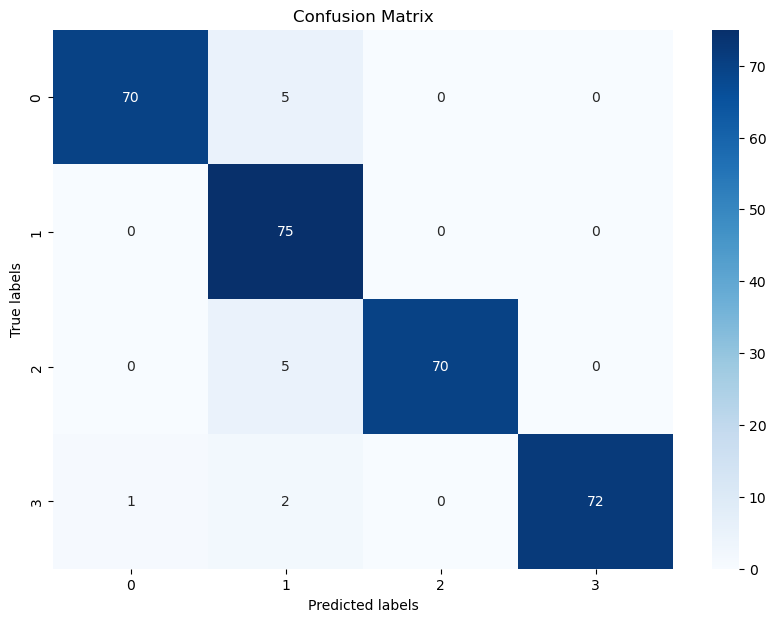

              precision    recall  f1-score   support

           0       0.99      0.93      0.96        75
           1       0.86      1.00      0.93        75
           2       1.00      0.93      0.97        75
           3       1.00      0.96      0.98        75

    accuracy                           0.96       300
   macro avg       0.96      0.96      0.96       300
weighted avg       0.96      0.96      0.96       300

Accuracy: 0.9566666666666667
Accuracy: 0.9566666666666667
Precision (Weighted): 0.9619961146187469
Recall (Weighted): 0.9566666666666667
F1 Score (Weighted): 0.9574847784072428


In [72]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns  # For a nicer confusion matrix visualization
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


# Get predictions from the model for the training set
y_pred = lstm.predict(X)

# Convert predictions and true labels from one-hot to integers
y_pred_labels = np.argmax(y_pred, axis=1)
y_train_labels = np.argmax(y, axis=1)

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_train_labels, y_pred_labels)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# Print classification report for precision, recall, f1-score
print(classification_report(y_train_labels, y_pred_labels))

# Optionally, calculate overall accuracy
accuracy = np.sum(y_train_labels == y_pred_labels) / len(y_train_labels)
print(f"Accuracy: {accuracy}")

# Calculate individual scores
accuracy = accuracy_score(y_train_labels, y_pred_labels)
precision = precision_score(y_train_labels, y_pred_labels, average='weighted')
recall = recall_score(y_train_labels, y_pred_labels, average='weighted')
f1 = f1_score(y_train_labels, y_pred_labels, average='weighted')

# Print individual scores
print(f"Accuracy: {accuracy}")
print(f"Precision (Weighted): {precision}")
print(f"Recall (Weighted): {recall}")
print(f"F1 Score (Weighted): {f1}")


In [48]:
res = lstm.predict(X_test)

2/2 [==============================] - 0s 33ms/step


In [49]:
actions[np.argmax(res[12])]

'pushup'

In [50]:
actions[np.argmax(y_test[12])]

'pushup'

# 9. Save Weights

In [46]:
lstm.save('wnew25kfold.keras')

In [50]:
del model

In [68]:
lstm.load_weights('wnew25.keras')

# 10. Evaluation using Confusion Matrix and Accuracy

In [36]:
from sklearn.metrics import multilabel_confusion_matrix, accuracy_score

In [37]:
yhat = lstm.predict(X_test)

2/2 [==============================] - 0s 25ms/step


In [38]:
ytrue = np.argmax(y_test, axis=1).tolist()
yhat = np.argmax(yhat, axis=1).tolist()

In [39]:
multilabel_confusion_matrix(ytrue, yhat)

array([[[32,  0],
        [ 0, 13]],

       [[34,  0],
        [ 0, 11]],

       [[36,  0],
        [ 0,  9]],

       [[33,  0],
        [ 0, 12]]], dtype=int64)

In [40]:
accuracy_score(ytrue, yhat)

1.0

# 11. Test in Real Time

In [41]:
from scipy import stats

In [42]:
colors = [(245,117,16), (117,245,16), (16,117,245), (20,137,220)]
def prob_viz(res, actions, input_frame, colors):
    output_frame = input_frame.copy()
    for num, prob in enumerate(res):
        cv2.rectangle(output_frame, (0,60+num*40), (int(prob*100), 90+num*40), colors[num], -1)
        cv2.putText(output_frame, actions[num], (0, 85+num*40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        
    return output_frame

In [24]:
plt.figure(figsize=(18,18))
plt.imshow(prob_viz(res, actions, image, colors))

NameError: name 'res' is not defined

<Figure size 1800x1800 with 0 Axes>

In [44]:
# 1. New detection variables
sequence = []
sentence = []
predictions = []
threshold = 0.5

cap = cv2.VideoCapture(0)
# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    while cap.isOpened():

        # Read feed
        ret, frame = cap.read()

        # Make detections
        image, results = mediapipe_detection(frame, holistic)
        print(results)
        
        # Draw landmarks
        draw_styled_landmarks(image, results)
        
        # 2. Prediction logic
        keypoints = extract_keypoints(results)
        sequence.append(keypoints)
        sequence = sequence[-30:]
        
        if len(sequence) == 30:
            res = model.predict(np.expand_dims(sequence, axis=0))[0]
            print(actions[np.argmax(res)])
            predictions.append(np.argmax(res))
            
            
        #3. Viz logic
            if np.unique(predictions[-10:])[0]==np.argmax(res): 
                if res[np.argmax(res)] > threshold: 
                    
                    if len(sentence) > 0: 
                        if actions[np.argmax(res)] != sentence[-1]:
                            sentence.append(actions[np.argmax(res)])
                    else:
                        sentence.append(actions[np.argmax(res)])

            if len(sentence) > 5: 
                sentence = sentence[-5:]

            # Viz probabilities
            image = prob_viz(res, actions, image, colors)
            
        cv2.rectangle(image, (0,0), (640, 40), (245, 117, 16), -1)
        cv2.putText(image, ' '.join(sentence), (3,30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
        
        # Show to screen
        cv2.imshow('OpenCV Feed', image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows()

<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.solution_base.SolutionOutputs'>
<class 'mediapipe.python.soluti

NameError: name 'model' is not defined

In [45]:
def calculate_angle(a,b,c):
    """
    Computes 3D joint angle inferred by 3 keypoints and their relative positions to one another
    
    """
    a = np.array(a) # First
    b = np.array(b) # Mid
    c = np.array(c) # End
    
    radians = np.arctan2(c[1]-b[1], c[0]-b[0]) - np.arctan2(a[1]-b[1], a[0]-b[0])
    angle = np.abs(radians*180.0/np.pi)
    
    if angle >180.0:
        angle = 360-angle
        
    return angle 

In [46]:
def get_coordinates(landmarks, mp_pose, side, joint):
    """
    Retrieves x and y coordinates of a particular keypoint from the pose estimation model
         
     Args:
         landmarks: processed keypoints from the pose estimation model
         mp_pose: Mediapipe pose estimation model
         side: 'left' or 'right'. Denotes the side of the body of the landmark of interest.
         joint: 'shoulder', 'elbow', 'wrist', 'hip', 'knee', or 'ankle'. Denotes which body joint is associated with the landmark of interest.
    
    """
    coord = getattr(mp_pose.PoseLandmark,side.upper()+"_"+joint.upper())
    x_coord_val = landmarks[coord.value].x
    y_coord_val = landmarks[coord.value].y
    return [x_coord_val, y_coord_val]        

In [47]:
def viz_joint_angle(image, angle, joint):
    """
    Displays the joint angle value near the joint within the image frame
    
    """
    cv2.putText(image, str(int(angle)), 
                   tuple(np.multiply(joint, [640, 480]).astype(int)), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2, cv2.LINE_AA
                        )
    return

In [48]:
def count_reps(image, current_action, landmarks, mp_pose):
    """
    Counts repetitions of each exercise. Global count and stage (i.e., state) variables are updated within this function.
    
    """

    global  squat_counter, squat_stage, pushup_counter, pushup_stage
        
    if current_action == 'squat':
        # Get coords
        # left side
        left_shoulder = get_coordinates(landmarks, mp_pose, 'left', 'shoulder')
        left_hip = get_coordinates(landmarks, mp_pose, 'left', 'hip')
        left_knee = get_coordinates(landmarks, mp_pose, 'left', 'knee')
        left_ankle = get_coordinates(landmarks, mp_pose, 'left', 'ankle')
        # right side
        right_shoulder = get_coordinates(landmarks, mp_pose, 'right', 'shoulder')
        right_hip = get_coordinates(landmarks, mp_pose, 'right', 'hip')
        right_knee = get_coordinates(landmarks, mp_pose, 'right', 'knee')
        right_ankle = get_coordinates(landmarks, mp_pose, 'right', 'ankle')
        
        # Calculate knee angles
        left_knee_angle = calculate_angle(left_hip, left_knee, left_ankle)
        right_knee_angle = calculate_angle(right_hip, right_knee, right_ankle)
        
        # Calculate hip angles
        left_hip_angle = calculate_angle(left_shoulder, left_hip, left_knee)
        right_hip_angle = calculate_angle(right_shoulder, right_hip, right_knee)
        
        # Squat counter logic
        thr = 165
        if (left_knee_angle < thr) and (right_knee_angle < thr) and (left_hip_angle < thr) and (right_hip_angle < thr):
            squat_stage = "down"
        if (left_knee_angle > thr) and (right_knee_angle > thr) and (left_hip_angle > thr) and (right_hip_angle > thr) and (squat_stage =='down'):
            squat_stage='up'
            squat_counter += 1
            
        # Viz joint angles
        viz_joint_angle(image, left_knee_angle, left_knee)
        viz_joint_angle(image, left_hip_angle, left_hip)
   
    elif current_action == 'pushup':
        # Get coords
        # left side
        left_shoulder = get_coordinates(landmarks, mp_pose, 'left', 'shoulder')
        left_elbow = get_coordinates(landmarks, mp_pose, 'left', 'elbow')
        left_wrist = get_coordinates(landmarks, mp_pose, 'left', 'wrist')
        # right side
        right_shoulder = get_coordinates(landmarks, mp_pose, 'right', 'shoulder')
        right_elbow = get_coordinates(landmarks, mp_pose, 'right', 'elbow')
        right_wrist = get_coordinates(landmarks, mp_pose, 'right', 'wrist')
        
        # Calculate elbow angles
        left_elbow_angle = calculate_angle(left_shoulder, left_elbow, left_wrist)
        right_elbow_angle = calculate_angle(right_shoulder, right_elbow, right_wrist)
        
        # Push-up counter logic
        thr = 160
        if (left_elbow_angle > thr) and (right_elbow_angle > thr):
            pushup_stage = "down"
        if (left_elbow_angle < thr) and (right_elbow_angle < thr) and (pushup_stage == "down"):
            pushup_stage = "up"
            pushup_counter += 1
            
        # Viz joint angles
        viz_joint_angle(image, left_elbow_angle, left_elbow)
        viz_joint_angle(image, right_elbow_angle, right_elbow)
                
    else:
        pass

In [49]:
def prob_viz(res, actions, input_frame, colors):
    """
    This function displays the model prediction probability distribution over the set of exercise classes
    as a horizontal bar graph
    
    """
    output_frame = input_frame.copy()
    for num, prob in enumerate(res):        
        cv2.rectangle(output_frame, (0,60+num*40), (int(prob*100), 90+num*40), colors[num], -1)
        cv2.putText(output_frame, actions[num], (0, 85+num*40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
        
    return output_frame

In [82]:
# 1. New detection variables
sequence = []
predictions = []
res = []
threshold = 0.5 # minimum confidence to classify as an action/exercise
current_action = ''
model_name = 'LSTM'

# Rep counter logic variables
squat_counter = 0
squat_stage = None

# Camera object
cap = cv2.VideoCapture(0)

# Video writer object that saves a video of the real time test
fourcc = cv2.VideoWriter_fourcc('M','J','P','G') # video compression format
HEIGHT = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)) # webcam video frame height
WIDTH = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)) # webcam video frame width
FPS = int(cap.get(cv2.CAP_PROP_FPS)) # webcam video fram rate 

video_name = os.path.join(os.getcwd(),f"{model_name}_real_time_testWithAll.avi")
out = cv2.VideoWriter(video_name, cv2.VideoWriter_fourcc(*"MJPG"), FPS, (WIDTH,HEIGHT))

# Set mediapipe model 
with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
    while cap.isOpened():

        # Read feed
        ret, frame = cap.read()

        # Make detection
        image, results = mediapipe_detection(frame, holistic)
        
        # Draw landmarks
        draw_landmarks(image, results)
        
        sequence_length = 30

        # 2. Prediction logic
        keypoints = extract_keypoints(results)        
        sequence.append(keypoints)      
        sequence = sequence[-sequence_length:]
              
        if len(sequence) == sequence_length:
            res = model.predict(np.expand_dims(sequence, axis=0), verbose=0)[0]           
            predictions.append(np.argmax(res))
            current_action = actions[np.argmax(res)]
            confidence = np.max(res)
            
        #3. Viz logic
            # Erase current action variable if no probability is above threshold
            if confidence < threshold:
                current_action = ''

            # Viz probabilities
            image = prob_viz(res, actions, image, colors)
            
            # Count reps
            try:
                landmarks = results.pose_landmarks.landmark
                count_reps(
                    image, current_action, landmarks, mp_holistic)
            except:
                pass

            # Display graphical information
            cv2.rectangle(image, (0,0), (640, 40), colors[np.argmax(res)], -1)
            cv2.putText(image, 'squat ' + str(squat_counter), (490,30), 
                           cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)
         
        # Show to screen
        cv2.imshow('OpenCV Feed', image)
        
        # Write to video file
        if ret == True:
            out.write(image)

        # Break gracefully
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
    cap.release()
    out.release()
    cv2.destroyAllWindows()

NameError: name 'model' is not defined